# Fungi MicroRNAs Classification
---
---

In [1]:
import multiprocessing

SEED = 42 # Seed for reproducibility
print('Availables CPU cores: ', multiprocessing.cpu_count())

Availables CPU cores:  8


---
## Data Exploration and Preprocessing

In [2]:
import pandas as pd
import numpy as np

dataset = pd.read_csv('Fungi_data.csv', sep=',').drop('Unnamed: 0', axis=1)

# Get dataset dimensions
matrix = np.matrix(dataset)
print('\n> Plants dataset:', matrix.shape[0], 'samples,', matrix.shape[1], 'features')
print(f"\n- miRNAs samples: {dataset[dataset['type'] == 'miRNA'].shape[0]}")
print(f"- Random samples: {dataset[dataset['type'] == 'rand'].shape[0]}")

dataset


> Plants dataset: 28481 samples, 29 features

- miRNAs samples: 13911
- Random samples: 14570


,mer,type,in_db,mer6,mer7,mer8,gc,gcs,cpg,cwf,...,ct3,ct4,ct5,ct6,cl1,cl2,cl3,cl4,cl5,cl6
0,GCCCGGTCGCAACAG,miRNA,1,244,68,40,0.733333,0.090909,0.066667,1.737050,...,0.714286,0.714286,0.714286,0.714286,1.0,0.777778,0.870968,0.906977,0.925926,0.937500
1,CATTTGGCCTGGCTA,miRNA,1,533,146,59,0.533333,0.000000,0.000000,1.709381,...,0.543956,0.498626,0.498626,0.498626,1.0,0.722222,0.774194,0.813953,0.851852,0.875000
2,TGCTTCTCTTCTACC,miRNA,1,568,221,90,0.466667,0.714286,0.000000,1.773701,...,0.395604,0.329670,0.299700,0.299700,1.0,0.666667,0.677419,0.720930,0.759259,0.796875
3,GGAGTAGCTCAGTTT,miRNA,1,449,168,85,0.466667,0.428571,0.000000,1.712485,...,0.659341,0.659341,0.659341,0.659341,1.0,0.777778,0.838710,0.883721,0.907407,0.921875
4,CATTTCTGTATAATC,miRNA,1,483,133,52,0.266667,0.500000,0.000000,1.740368,...,0.642857,0.642857,0.642857,0.642857,1.0,0.722222,0.838710,0.883721,0.907407,0.921875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28476,ATCCCTTTGCGTTGG,rand,0,302,66,17,0.533333,0.000000,0.062500,1.733947,...,0.659341,0.659341,0.659341,0.659341,1.0,0.777778,0.838710,0.883721,0.907407,0.921875
28477,ACCTTTCGCGGCACG,rand,0,144,34,9,0.666667,0.200000,0.125000,1.714448,...,0.642857,0.642857,0.642857,0.642857,1.0,0.722222,0.838710,0.883721,0.907407,0.921875
28478,GAGTCTTACGGAAGA,rand,0,274,42,8,0.466667,0.428571,0.100000,1.712485,...,0.785714,0.785714,0.785714,0.785714,1.0,0.833333,0.903226,0.930233,0.944444,0.953125
28479,GCGTTCTCGGTTAGC,rand,0,248,39,3,0.600000,0.111111,0.100000,1.731983,...,0.593407,0.593407,0.593407,0.593407,1.0,0.722222,0.806452,0.860465,0.888889,0.906250


### Split data

In [3]:
from sklearn.model_selection import train_test_split

# Split in train and test data
X = dataset.drop(['mer', 'type', 'in_db'], axis=1)
y = dataset['type'].replace(['miRNA','rand'], [1, 0])

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED)

print(f"> Train data : {X_train_val.shape[0]} samples ( {round((X_train_val.shape[0]/X.shape[0])*100, 2)}% )")
print(f"> Test data  : {X_test.shape[0]} samples ( {round((X_test.shape[0]/X.shape[0])*100, 2)}% )")

> Train data : 22784 samples ( 80.0% )
> Test data  : 5697 samples ( 20.0% )


In [4]:
print("- Class distribution:")
print(f"> Train data : {list(y_train_val.value_counts())[0]} Random, {list(y_train_val.value_counts())[1]} miRNA")
print(f"> Test data  : {list(y_test.value_counts())[0]} Random, {list(y_test.value_counts())[1]} miRNA")

- Class distribution:
> Train data : 11644 Random, 11140 miRNA
> Test data  : 2926 Random, 2771 miRNA


In [5]:
from sklearn.preprocessing import MinMaxScaler

# Data normalization
scaler = MinMaxScaler()

X_train_val_std = X_train_val.copy()
X_test_std = X_test.copy()
cols = list(X.columns)

X_train_val_std[cols] = scaler.fit_transform(X_train_val[cols])
X_test_std[cols] = scaler.transform(X_test[cols])

X_train_val_std # Train data normalized

,mer6,mer7,mer8,gc,gcs,cpg,cwf,ce,cm1,cm2,...,ct3,ct4,ct5,ct6,cl1,cl2,cl3,cl4,cl5,cl6
2897,0.296017,0.295652,0.294872,0.545455,0.933333,0.000000,0.724048,0.512247,0.512247,0.503922,...,0.447059,0.471910,0.479355,0.481860,1.0,0.454545,0.60,0.714286,0.771429,0.804878
24176,0.270183,0.188406,0.102564,0.545455,0.400000,0.111111,0.349736,0.778037,0.778037,0.721786,...,0.635294,0.651685,0.656596,0.658248,1.0,0.636364,0.75,0.821429,0.857143,0.878049
7042,0.386437,0.443478,0.416667,0.545455,0.133333,0.200000,0.084157,0.939180,0.939180,0.721786,...,0.694118,0.707865,0.711984,0.713369,1.0,0.636364,0.80,0.857143,0.885714,0.902439
725,0.475780,0.344928,0.294872,0.000000,0.400000,0.000000,0.452735,0.696546,0.696546,0.625981,...,0.564706,0.584270,0.590131,0.592103,1.0,0.545455,0.70,0.785714,0.828571,0.853659
4618,0.377826,0.368116,0.333333,0.090909,0.000000,0.000000,0.319946,0.715378,0.715378,0.582680,...,0.564706,0.584270,0.590131,0.592103,1.0,0.545455,0.70,0.785714,0.828571,0.853659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21575,0.231432,0.249275,0.192308,0.272727,0.000000,0.222222,0.029790,0.974062,0.974062,0.625981,...,0.458824,0.441011,0.448892,0.451543,1.0,0.545455,0.60,0.678571,0.742857,0.780488
5390,0.595264,0.379710,0.410256,0.363636,0.514286,0.200000,0.113947,0.913242,0.913242,0.721786,...,0.694118,0.707865,0.711984,0.713369,1.0,0.636364,0.80,0.857143,0.885714,0.902439
860,0.645856,0.515942,0.506410,0.454545,0.000000,0.125000,0.319946,0.803975,0.803975,0.582680,...,0.511765,0.533708,0.540282,0.542493,1.0,0.545455,0.65,0.750000,0.800000,0.829268
15795,0.292788,0.202899,0.076923,0.636364,0.720000,0.250000,0.507102,0.626782,0.626782,0.582680,...,0.617647,0.634831,0.639980,0.641712,1.0,0.545455,0.75,0.821429,0.857143,0.878049


In [7]:
X_train_val # Train data no normalized

,mer6,mer7,mer8,gc,gcs,cpg,cwf,ce,cm1,cm2,...,ct3,ct4,ct5,ct6,cl1,cl2,cl3,cl4,cl5,cl6
2897,329,102,46,0.600000,0.777778,0.000000,1.776048,1.532915,0.766457,0.697113,...,0.483516,0.483516,0.483516,0.483516,1.0,0.666667,0.741935,0.813953,0.851852,0.875000
24176,305,65,16,0.600000,0.333333,0.055556,1.737050,1.781937,0.890969,0.808982,...,0.659341,0.659341,0.659341,0.659341,1.0,0.777778,0.838710,0.883721,0.907407,0.921875
7042,413,153,65,0.600000,0.111111,0.100000,1.709381,1.932915,0.966457,0.808982,...,0.714286,0.714286,0.714286,0.714286,1.0,0.777778,0.870968,0.906977,0.925926,0.937500
725,496,119,46,0.200000,0.333333,0.000000,1.747781,1.705587,0.852794,0.759787,...,0.593407,0.593407,0.593407,0.593407,1.0,0.722222,0.806452,0.860465,0.888889,0.906250
4618,405,127,52,0.266667,0.000000,0.000000,1.733947,1.723231,0.861616,0.737553,...,0.593407,0.593407,0.593407,0.593407,1.0,0.722222,0.806452,0.860465,0.888889,0.906250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21575,269,86,30,0.400000,0.000000,0.111111,1.703717,1.965596,0.982798,0.759787,...,0.494505,0.453297,0.453297,0.453297,1.0,0.722222,0.741935,0.790698,0.833333,0.859375
5390,607,131,64,0.466667,0.428571,0.100000,1.712485,1.908613,0.954306,0.808982,...,0.714286,0.714286,0.714286,0.714286,1.0,0.777778,0.870968,0.906977,0.925926,0.937500
860,654,178,79,0.533333,0.000000,0.062500,1.733947,1.806239,0.903119,0.737553,...,0.543956,0.543956,0.543956,0.543956,1.0,0.722222,0.774194,0.837209,0.870370,0.890625
15795,326,70,12,0.666667,0.600000,0.125000,1.753445,1.640224,0.820112,0.737553,...,0.642857,0.642857,0.642857,0.642857,1.0,0.722222,0.838710,0.883721,0.907407,0.921875


### KFold for CV

In [6]:
from sklearn.model_selection import KFold

# KFold
splits = 5
k_fold = KFold(n_splits=splits, shuffle=True, random_state=SEED)

# Get train and validation folds for cross-validation
index = 0
X_train, X_val, y_train, y_val = [0]*5, [0]*5, [0]*5, [0]*5
X_train_std, X_val_std, y_train_std, y_val_std = [0]*5, [0]*5, [0]*5, [0]*5

print("\n> Kfold indexes for train and validation data:\n")
for train_index, val_index in k_fold.split(X_train_val):
  print("TRAIN:", train_index, "VAL:", val_index)
  # Non normalized data
  X_train[index], X_val[index] = X_train_val.iloc[train_index], X_train_val.iloc[val_index]
  y_train[index], y_val[index] = y_train_val.iloc[train_index], y_train_val.iloc[val_index]
  # Normalized data
  X_train_std[index], X_val_std[index] = X_train_val_std.iloc[train_index], X_train_val_std.iloc[val_index]
  y_train_std[index], y_val_std[index] = y_train_val.iloc[train_index], y_train_val.iloc[val_index]
  index+=1


> Kfold indexes for train and validation data:

TRAIN: [    0     1     2 ... 22780 22781 22783] VAL: [    3    17    31 ... 22754 22771 22782]
TRAIN: [    1     2     3 ... 22781 22782 22783] VAL: [    0     4     5 ... 22768 22769 22780]
TRAIN: [    0     1     3 ... 22781 22782 22783] VAL: [    2     7    10 ... 22776 22778 22779]
TRAIN: [    0     2     3 ... 22781 22782 22783] VAL: [    1    12    18 ... 22759 22773 22777]
TRAIN: [    0     1     2 ... 22779 22780 22782] VAL: [    9    11    13 ... 22774 22781 22783]


In [7]:
print("--- Class distribution ---")
for i in range(splits):
    print(f"\n- Split {i+1}:")
    print(f"> Train data : {list(y_train[i].value_counts())[0]} Random, {list(y_train[i].value_counts())[1]} miRNA")
    print(f"> Val data   : {list(y_val[i].value_counts())[0]} Random, {list(y_val[i].value_counts())[1]} miRNA")

--- Class distribution ---

- Split 1:
> Train data : 9284 Random, 8943 miRNA
> Val data   : 2360 Random, 2197 miRNA

- Split 2:
> Train data : 9238 Random, 8989 miRNA
> Val data   : 2406 Random, 2151 miRNA

- Split 3:
> Train data : 9305 Random, 8922 miRNA
> Val data   : 2339 Random, 2218 miRNA

- Split 4:
> Train data : 9344 Random, 8883 miRNA
> Val data   : 2300 Random, 2257 miRNA

- Split 5:
> Train data : 9405 Random, 8823 miRNA
> Val data   : 2317 Random, 2239 miRNA


---
## Data Distribution Visualization

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

# Divide data by classes
miRNA_data = X[(dataset['type'] == 'miRNA')]
rand_data = X[(dataset['type'] == 'rand')]

# Histograms of features distribution
k = 1
fig = plt.figure(figsize=(20,64), dpi=300)
plt.subplots_adjust(hspace=0.5)
fig.suptitle('Fungi Data Distribution', fontsize=20, y=0.9)

for col in X.columns[0:26]:
  plt.subplot(13,2,k)
  limits = [min(X[col]), max(X[col])]
  sns.histplot(rand_data[col], bins=20, binrange=limits, kde=True, color="salmon")
  sns.histplot(miRNA_data[col], bins=20, binrange=limits, kde=True, color="#86bf91")
  plt.title(col.capitalize(), fontsize=16)
  plt.xlabel("Values")
  plt.ylabel("Frequency")
  plt.legend(labels=['Random','miRNA'])
  k+=1

---
## Tools

Run the RFEH method (Recursive Feature Elimination with Grid Search for hyperparams tuning) with cross validation

In [16]:
from RFEH import RFEH

def rfeh_cv(X_train, X_val, estimator, params_grid, save_path, n_reload = None, split_reload = 0):
    """
    Run the RFEH with cross-validation, using predefined splits with K-fold.

    Can be reloaded from a specific split and number of features.
    """
    rfeh = [0]*splits

    for i in range(split_reload, splits):
        rfeh[i] = RFEH(
                        train_data  = [X_train[i], y_train[i]],
                        val_data    = [X_val[i], y_val[i]],
                        model       = estimator,
                        params_grid = params_grid,
                        metrics     = 'f1',
                        rank_score  = 'gini',
                        seed        = SEED
                        )
        print(f'\nSplit {i+1}:')
        best_result = rfeh[i].run(n_reload=n_reload, save_temp=True, save_path=f"{save_path}/split_{i}")
        print(f"=== Best Results ==={'='*80}\n",
              f"> No. Features: {best_result['n_features']}\n",
              f"> F1 Score: {best_result['score']}\n",
              f"> Hyperparameters: {best_result['hyperparams']}\n{'='*100}"
              )
        # Save results
        rfeh[i].full_results_.to_csv(f"{save_path}/split_{i}/results.csv")
        
        feat_import = rfeh[i].feature_importances_
        features_df = pd.DataFrame({'feature': feat_import.keys(), 'importance': feat_import.values()})
        features_df = features_df.sort_values('importance', ascending = False).reset_index(drop=True)
        features_df.to_csv(f'{save_path}/split_{i}/feature_importances.csv')
        
        n_reload = None

    return rfeh

Methods to summary and save the RFEH results

In [17]:
def save_splits_results(rfeh, save_path):
    """ 
    Save the RFEH results summary of every split in cross-validation.
    """
    splits_results = pd.DataFrame(rfeh[0].results_summary_).drop(['hyperparams', 'score'], axis=1)

    for i in range(splits):
        splits_results[f"params_split_{i}"] = rfeh[i].results_summary_['hyperparams']
        splits_results[f"score_split_{i}"] = rfeh[i].results_summary_['score']

    splits_results['mean_scores'] = splits_results.filter(regex = '(score*)').mean(axis=1)
    splits_results['std_scores'] = splits_results.filter(regex = '(score*)').std(axis=1)
    splits_results.to_csv(f'{save_path}/splits_results_summary.csv', index=False)
    return splits_results

In [18]:
def best_results_cv(save_path, colors = ['slateblue', 'salmon']):
    """
    Get a Dataframe with the best configuration of every split in cross-validation.
    """
    best_results = pd.DataFrame()

    for i in range(splits):
        split = pd.read_csv(f'{save_path}/split_{i}/results.csv')
        split = split.sort_values('mean_test_score', ascending = False)
        split = split.reset_index(drop=True).head(1)
        split['data'] = f'Split {i+1}'
        best_results = pd.concat([best_results, split])

    # Simplify columns names and remove innecesary information
    best_results.columns = [col.replace(f'param_', '') for col in best_results.columns]
    best_results.columns = [col.replace(f'mean_', '') for col in best_results.columns]
    best_results = best_results.drop(['params', 'std_fit_time', 'std_score_time', 'rank_test_score', 
                                      'split0_test_score', 'std_test_score'], axis=1)
    # Reorder the columns
    reoder = ['fit_time', 'score_time']
    best_results = best_results[[col for col in best_results.columns if col not in reoder] + reoder]
    best_results['n_features'] = best_results['n_features'].round()
    best_results = best_results.set_index('data')
    return best_results.style.highlight_max(['fit_time', 'score_time'], color=colors[0], axis=0)\
                             .highlight_min(['test_score'], color=colors[0], axis=0)\
                             .highlight_max(['test_score'], color=colors[1], axis=0)\
                             .highlight_min(['fit_time', 'score_time'], color=colors[1], axis=0)\
                             .format({'n_features': '{:,.0f}'.format})

Methods to visualize the feature selection curves

In [19]:
def plot_rfeh_results(results, ax, title, std = False, score_metric = 'F1', 
                      colors = ['slateblue', 'salmon'], y_lims = [0, 1]):
    ''' 
    Plot the score results of every set of features.
    '''
    scores = results['score']
    n_features = results['n_features']
    
    if std: std_scores = results['std_scores']
    else: std_scores = 0

    ax.fill_between(results['n_features'], 
                    scores-std_scores, 
                    scores+std_scores, 
                    color=colors[0],
                    alpha=0.3
                    )
    ax.plot(n_features, scores, color=colors[0])
    ax.scatter(n_features, scores, color=colors[0])
    ax.scatter([n_features.iloc[scores.idxmax()]], [max(scores)], s=200, facecolors='none', color=colors[1])
    ax.plot([n_features.iloc[scores.idxmax()]]*2, [y_lims[0], max(scores)-0.001], linestyle='--', color=colors[1])
    ax.set_title(title, fontsize=14)
    ax.set_ylabel(f"{score_metric.capitalize()} Score")
    ax.set_xlabel("Number of Features")
    ax.set_ylim(y_lims)
    return None

In [21]:
def plot_rfeh_splits(splits_results, model_name, colors = ['slateblue', 'salmon'], y_lims = [0, 1]):
    """
    Plot the results of all splits and mean results.
    """
    fig, ax = plt.subplots(2, 3, figsize=(18, 8), dpi=300)
    fig.suptitle(f"Feature Selection for {model_name}", fontsize= 20)
    for i in range(splits):
        split_result = splits_results[['n_features', f'score_split_{i}']]
        split_result.columns = ['n_features', 'score']
        axes = [0,i] if i < 3 else [1, i-3]
        plot_rfeh_results(split_result, ax[axes[0], axes[1]], f"Split {i+1}", colors=colors, y_lims=y_lims)

    split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
    split_result.columns = ['n_features', 'score', 'std_scores']
    plot_rfeh_results(split_result, ax[1, 2], f"Mean Scores", std=True, colors=colors, y_lims=y_lims)
    fig.tight_layout()
    return None

Method to evaluate classifiers in test data

In [22]:
import sklearn.metrics as metrics
from time import time

def estimator_evaluation(estimator, train_data, test_data, n_features, save_path, model_name):
    """
    Evaluate a classifier model and get relevance metrics.
    """
    # Get selected features
    features_importances = pd.read_csv(f'{save_path}/feature_importances.csv')
    features = list(features_importances['feature'])[::-1][26-n_features:]

    X_train, y_train = train_data
    X_test, y_test = test_data

    # Fit classifier
    train_init = time()
    estimator.fit(X_train[features].values, y_train)
    train_end = time()

    # Make predictions
    test_init = time()
    prediction = estimator.predict(X_test[features].values)
    test_end = time()

    # Evaluate and get results
    evaluation = {
                  "Accuracy"   : metrics.accuracy_score(y_test, prediction),
                  "Precision"  : metrics.precision_score(y_test, prediction),
                  "Recall"     : metrics.recall_score(y_test, prediction),
                  "F1 Score"   : metrics.f1_score(y_test, prediction),
                  "Train Time" : train_end - train_init,
                  "Test Time"  : test_end - test_init,
                 }

    evaluation_report = pd.DataFrame(evaluation, index = [model_name])

    # Confusion Matrix
    cm = metrics.confusion_matrix(y_test, prediction, labels=[1, 0])
    cm_disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['miRNA', 'rand'])
    return evaluation_report, cm_disp, prediction

---
# 1. Random Forest

## 1.1. Features and hyperparameters selection

In [12]:
from sklearn.ensemble import RandomForestClassifier

# Classifier
estimator = RandomForestClassifier(random_state = SEED)

# Hyperparameters to evaluate
params_grid = {'n_estimators': [100, 200, 400, 600, 800, 1000],
               'criterion'   : ['gini', 'entropy']
              }
# Colors to classifier results
colors = ['#5EBD2A', 'salmon']

#### Non-normalized data

In [18]:
%%time
save_path = f'FungiData/RandomForest'

# Search best configurations
rf_rfeh = rfeh_cv(X_train, X_val, estimator, params_grid, save_path)
rf_splits_results = save_splits_results(rf_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 11
 > F1 Score: 0.9634255129348795
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 200}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 7
 > F1 Score: 0.9614419347478896
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 1000}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 17
 > F1 Score: 0.9664310954063604
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 1000}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 11
 > F1 Score: 0.9651567944250871
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 100}

Split 5:
=== Best Results ===========================================================

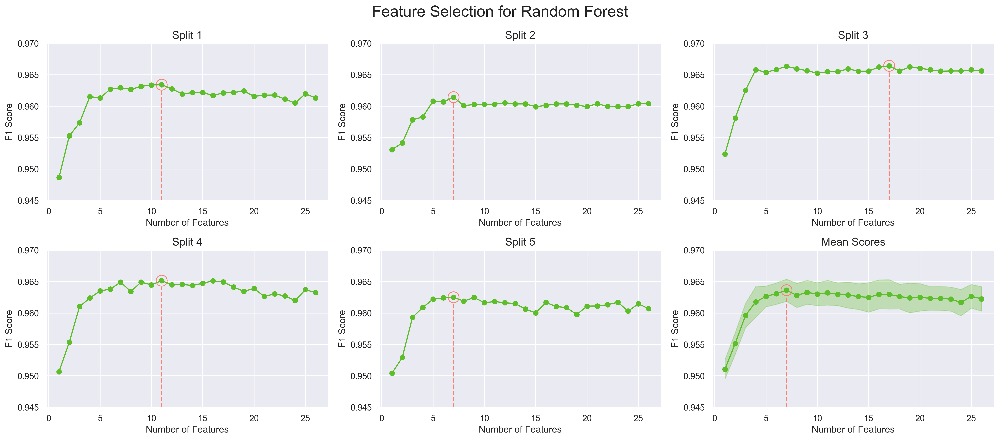

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'FungiData/RandomForest'
rf_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(rf_splits_results, "Random Forest", y_lims=[0.945, 0.97], colors=colors)

#### On Normalized data

In [20]:
%%time
save_path = f'FungiData/RandomForest/Normalized'

# Search best configurations
rf_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
rf_splits_results = save_splits_results(rf_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 11
 > F1 Score: 0.963409192324855
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 200}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 7
 > F1 Score: 0.9614419347478896
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 1000}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 7
 > F1 Score: 0.9665707327872483
 > Hyperparameters: {'criterion': 'gini', 'n_estimators': 200}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 16
 > F1 Score: 0.9656372335798173
 > Hyperparameters: {'criterion': 'entropy', 'n_estimators': 1000}

Split 5:
=== Best Results =============================================================

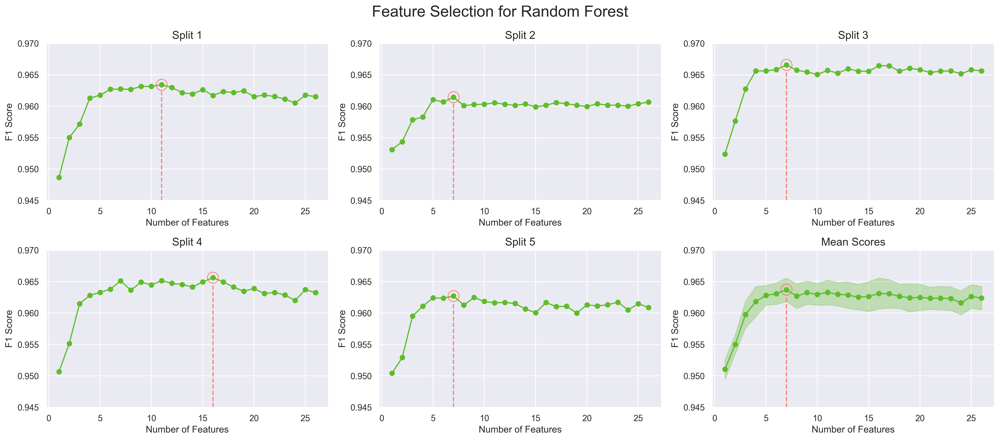

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'FungiData/RandomForest/Normalized'
rf_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(rf_splits_results, "Random Forest", y_lims=[0.945, 0.97], colors=colors)

### Non-Normalized vs Normalized data

,n_features,criterion,n_estimators,test_score,fit_time,score_time,n_features (n),criterion (n),n_estimators (n),test_score (n),fit_time (n),score_time (n)
data,,,,,,,,,,,,
Split 1,11,entropy,200,0.963426,2.848999,0.098002,11,entropy,200,0.963409,2.839449,0.089861
Split 2,7,entropy,1000,0.961442,10.201996,0.424000,7,entropy,1000,0.961442,10.007920,0.430364
Split 3,17,gini,1000,0.966431,13.172108,0.426000,7,gini,200,0.966571,2.337993,0.107000
Split 4,11,entropy,100,0.965157,1.471858,0.062866,16,entropy,1000,0.965637,13.065388,0.426087
Split 5,7,gini,1000,0.962508,10.022213,0.453618,7,gini,1000,0.962712,9.873105,0.440000


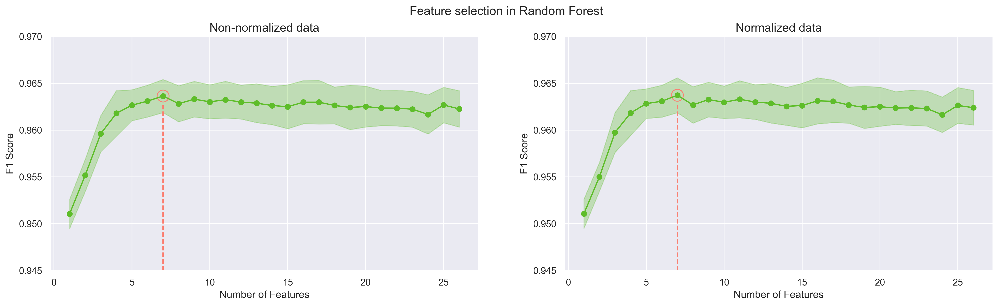

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'FungiData/RandomForest'
colors = ['#5EBD2A', 'salmon']

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
std_splits_results = pd.read_csv(f'{save_path}/Normalized/splits_results_summary.csv')

split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

std_split_result = std_splits_results[['n_features', 'mean_scores', 'std_scores']]
std_split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(1, 2, figsize=(20,5), dpi=300)
fig.suptitle("Feature selection in Random Forest")
plot_rfeh_results(split_result, ax[0], f"Non-normalized data", std=True, y_lims=[0.945, 0.97], colors=colors)
plot_rfeh_results(std_split_result, ax[1], f"Normalized data", std=True, y_lims=[0.945, 0.97], colors=colors)

# View the detail of the best configurations from every split
results = best_results_cv(save_path=save_path).data
std_results = best_results_cv(save_path=f"{save_path}/Normalized").data
std_results.columns = [col+' (n)' for col in std_results.columns]

compare_Results = pd.concat([results, std_results], axis=1)
compare_Results.style.highlight_max(['fit_time','score_time','fit_time (n)','score_time (n)'], color=colors[0], axis=0)\
                     .highlight_min(['test_score','test_score (n)'], color=colors[0], axis=0)\
                     .highlight_max(['test_score','test_score (n)'], color=colors[1], axis=0)\
                     .highlight_min(['fit_time','score_time','fit_time (n)','score_time (n)'], color=colors[1], axis=0)

The best number of features in both cases are 7.

For a better decision about parameters, the performance in each number of estimators is graphed below.

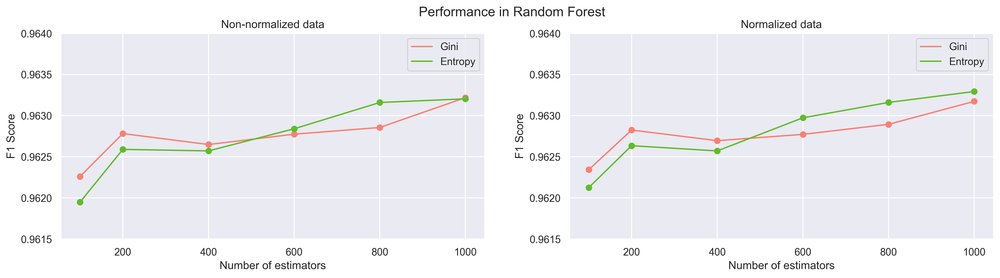

In [31]:
# Compare number of estimators in best number of features
n_features = [7, 7]
save_path = f'FungiData/RandomForest'
colors = ['#5EBD2A', 'salmon']

scores_gini, scores_gini_std = [], []
scores_entropy, scores_entropy_std = [], []

for i in range(splits):
    df = pd.read_csv(f"{save_path}/split_{i}/{n_features[0]}_features.csv")
    df_std = pd.read_csv(f"{save_path}/Normalized/split_{i}/{n_features[1]}_features.csv")
    
    scores_gini.append(df[df['param_criterion'] == 'gini']['mean_test_score'])
    scores_entropy.append(df[df['param_criterion'] == 'entropy']['mean_test_score'])

    scores_gini_std.append(df_std[df_std['param_criterion'] == 'gini']['mean_test_score'])
    scores_entropy_std.append(df_std[df_std['param_criterion'] == 'entropy']['mean_test_score'])

    n_estimators = df[df['param_criterion'] == 'gini']['param_n_estimators']

# Plot the comparation
scores = [[scores_gini, scores_entropy], [scores_gini_std, scores_entropy_std]]
fig, ax = plt.subplots(1, 2, figsize=(18,4), dpi=300)
fig.suptitle("Performance in Random Forest")
for i in range(2):
    ax[i].set_title("Non-normalized data" if i == 0 else "Normalized data")
    ax[i].plot(n_estimators, np.mean(scores[i][0], axis=0), color=colors[1], label="Gini")
    ax[i].scatter(n_estimators, np.mean(scores[i][0], axis=0), color=colors[1])
    ax[i].plot(n_estimators, np.mean(scores[i][1], axis=0), color=colors[0], label="Entropy")
    ax[i].scatter(n_estimators, np.mean(scores[i][1], axis=0), color=colors[0])
    ax[i].set_ylabel("F1 Score")
    ax[i].set_xlabel("Number of estimators")
    ax[i].set_ylim([0.9615, 0.964])
    ax[i].legend()

It seems that the best results in both are with entropy criterion, but is a very little diference if we look the scale. Also, normalized data is very close to Non-normalized, so we can don't worry about loss a posible better result with non-normalized data.

Anyways, both are getting a better performance with 1000 estimators.

## 1.2. Evaluation in test data

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
"Random Forest (1000 estimators, gini)",0.958399,0.935395,0.982317,0.958282,10.949088,0.517000
"Random Forest (1000 estimators, entropy)",0.958224,0.935972,0.981234,0.958069,1.127962,0.054003
"Random Forest (200 estimators, entropy)",0.958224,0.935373,0.981956,0.958099,2.899939,0.101103


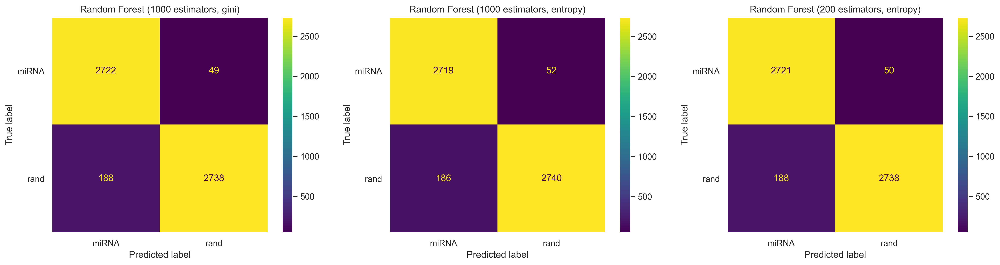

In [21]:
from sklearn.ensemble import RandomForestClassifier

save_path = f'FungiData/RandomForest/split_0'
colors = ['#5EBD2A', 'salmon']

# Best classifiers
n_features = 8

best_estimators = [0]*3
best_estimators[0] = RandomForestClassifier(n_estimators=1000, criterion='gini', random_state = SEED)
best_estimators[1] = RandomForestClassifier(n_estimators=100, criterion='entropy', random_state = SEED)
best_estimators[2] = RandomForestClassifier(n_estimators=200, criterion='entropy', random_state = SEED)

report, conf_matrix = [0]*len(best_estimators), [0]*len(best_estimators)
model_names = ["Random Forest (1000 estimators, gini)", "Random Forest (1000 estimators, entropy)", "Random Forest (200 estimators, entropy)"]

# Evaluate the best classifiers
for i in range(len(best_estimators)):
    report[i], conf_matrix[i], _ = estimator_evaluation(
                                    estimator  = best_estimators[i], 
                                    train_data = [X_train_val_std, y_train_val], 
                                    test_data  = [X_test_std, y_test],
                                    n_features = n_features,
                                    save_path  = save_path,
                                    model_name = model_names[i]
                                )
# Plot confusion matrix
fig, ax = plt.subplots(1, len(best_estimators), figsize=(22,5), dpi=300)
full_report = pd.DataFrame()
for i in range(len(best_estimators)):
    ax[i].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[i])
    ax[i].grid(False)
    full_report = pd.concat([full_report, report[i]], axis=0)

full_report.style.highlight_max(color=colors[0], axis=0)

Finally Gini is better actually, when we evaluate in new data, but is entropy is close.

---
# 2. Support Vector Machines

### 2.1. Features and hyperparameters selection

In [22]:
from sklearn.svm import SVC

# Classifier
estimator = SVC(random_state=SEED)

# Hyperparameters to evaluate
params_grid = {'C'      : [1, 10, 100],
               'gamma'  : [0.01, 0.1, 1],
               'kernel' : ['linear', 'rbf']
              }
# Colors to classifier results
colors = ['#F3A230', 'salmon']

In [23]:
%%time
save_path = f'FungiData/SVM'

# Search best configurations
svm_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
svm_splits_results = save_splits_results(svm_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 3
 > F1 Score: 0.9621717846016911
 > Hyperparameters: {'C': 100, 'gamma': 1, 'kernel': 'rbf'}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 5
 > F1 Score: 0.9617936398993366
 > Hyperparameters: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 10
 > F1 Score: 0.9689716312056736
 > Hyperparameters: {'C': 100, 'gamma': 0.1, 'kernel': 'rbf'}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 15
 > F1 Score: 0.9653204565408253
 > Hyperparameters: {'C': 10, 'gamma': 0.01, 'kernel': 'linear'}

Split 5:
=== Best Results ===========================================================================

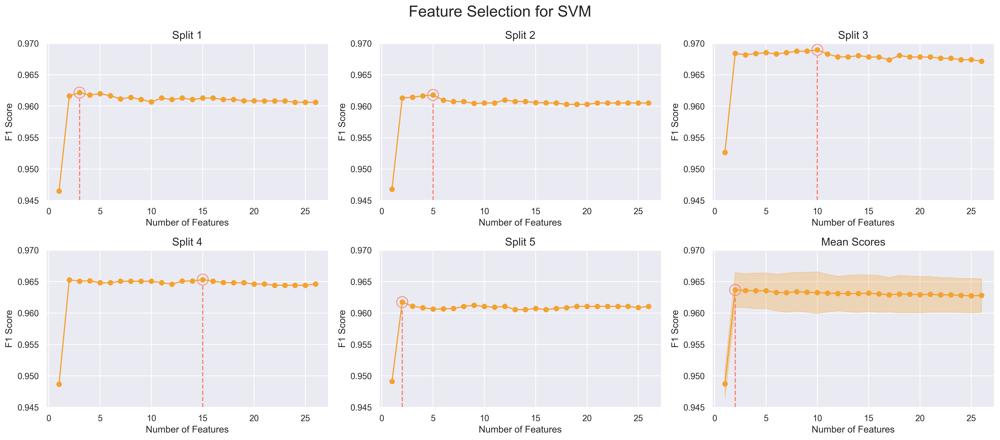

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'FungiData/SVM'
svm_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(svm_splits_results, "SVM", y_lims=[0.945, 0.97], colors=colors)

### Selection results summary

,n_features,C,gamma,kernel,test_score,fit_time,score_time
data,,,,,,,
Split 1,3,100,1.000000,rbf,0.962172,1.142552,0.391836
Split 2,5,10,0.100000,rbf,0.961794,2.273090,0.689291
Split 3,10,100,0.100000,rbf,0.968972,1.908408,0.489051
Split 4,15,10,0.010000,linear,0.965320,5.574233,0.207213
Split 5,2,1,0.100000,rbf,0.961742,2.506906,0.750001


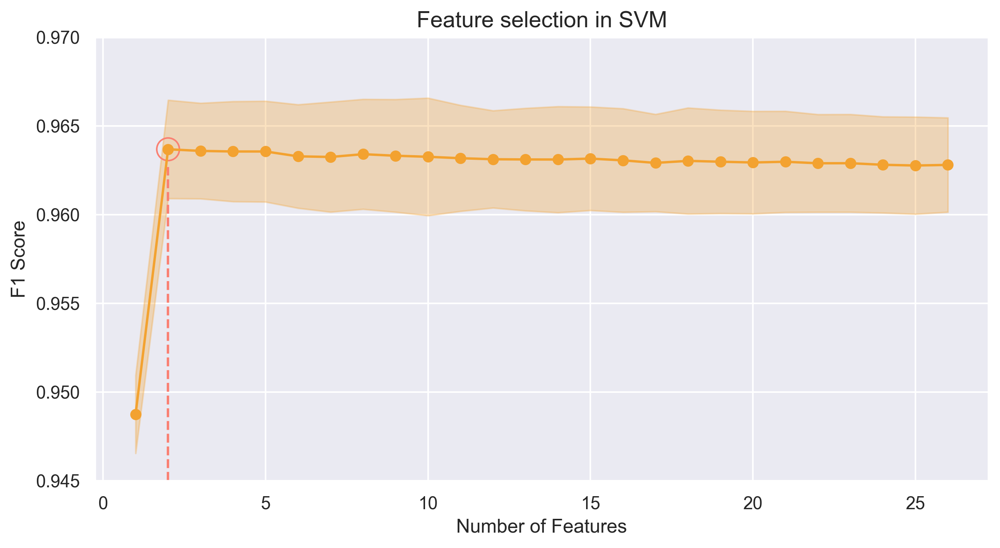

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'FungiData/SVM'
colors = ['#F3A230', 'salmon']

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(figsize=(10,5), dpi=300)
plot_rfeh_results(split_result, ax, f"Feature selection in SVM", std=True, y_lims=[0.945, 0.97], colors=colors)

# View the detail of the best configurations from every split
best_results_cv(save_path=save_path, colors=colors)

It's looks like with 2 features got the best results, but maybe is not really enough for an SVM classifier.

In [26]:
split_result.sort_values(by='score', ascending=False).reset_index(drop=True).head(5)

,n_features,score,std_scores
0,2,0.963681,0.002774
1,3,0.963588,0.002695
2,5,0.963556,0.002842
3,4,0.963555,0.002823
4,8,0.963404,0.003099


In this case, seems like is getting better results with less features in general, let's take 2 and 8 features.

## 2.3. Evaluation in test data

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
"SVM RBF C = 100, gamma = 1 (2 Features)",0.959101,0.940625,0.977625,0.958768,1.280998,0.603024
"SVM RBF C = 100, gamma = 1 (8 Features)",0.959452,0.941279,0.977625,0.959108,1.628000,0.643000
"SVM RBF C = 100, gamma = 0.1 (2 Features)",0.959803,0.941013,0.978708,0.959491,1.398001,0.709999
"SVM RBF C = 100, gamma = 0.1 (8 Features)",0.958575,0.940257,0.976904,0.958230,1.769000,0.759000


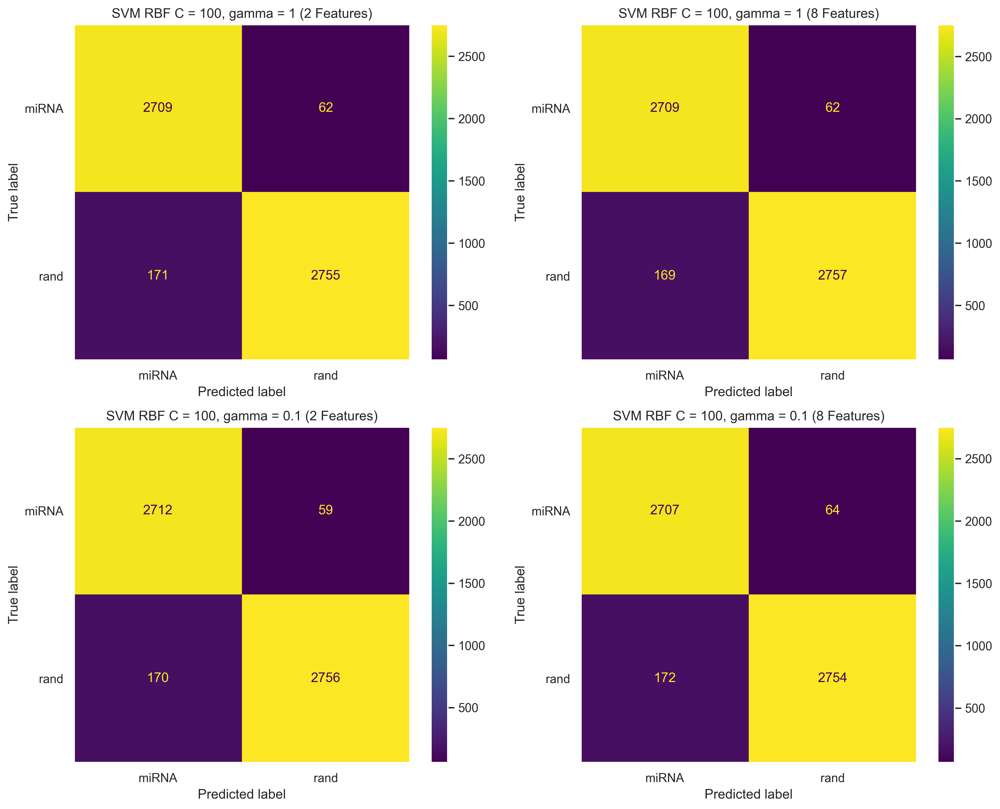

In [48]:
from sklearn.svm import SVC

save_path = f'FungiData/SVM/split_0'
colors = ['#F3A230', 'salmon']

# Best classifier
n_features = [2, 8]
best_estimator = [0]*2
best_estimator[0] = SVC(C = 100, gamma = 0.1, kernel = 'rbf', random_state = SEED)
best_estimator[1] = SVC(C = 10, gamma = 0.1, kernel = 'rbf', random_state = SEED)

op_names = ['C = 100, gamma = 1', 'C = 100, gamma = 0.1', 'C = 10, gamma = 0.1']
report, conf_matrix = [0]*4, [0]*4

fig, ax = plt.subplots(2, 2, figsize=(15,12), dpi=300)
for i in range(2):
    report[i*2], conf_matrix[i*2], _ = estimator_evaluation(
                                            estimator  = best_estimator[i], 
                                            train_data = [X_train_val_std, y_train_val], 
                                            test_data  = [X_test_std, y_test],
                                            n_features = n_features[0],
                                            save_path  = save_path,
                                            model_name = f"SVM RBF {op_names[i]} (2 Features)"
                                        )
    report[(i*2)+1], conf_matrix[(i*2)+1], _ = estimator_evaluation(
                                            estimator  = best_estimator[i], 
                                            train_data = [X_train_val_std, y_train_val], 
                                            test_data  = [X_test_std, y_test],
                                            n_features = n_features[1],
                                            save_path  = save_path,
                                            model_name = f"SVM RBF {op_names[i]} (8 Features)"
                                        )
    # Plot confusion matrix
    ax[i, 0].set_title(f"SVM RBF {op_names[i]} (2 Features)")
    ax[i, 1].set_title(f"SVM RBF {op_names[i]} (8 Features)")
    conf_matrix[i*2].plot(ax=ax[i, 0])
    conf_matrix[(i*2)+1].plot(ax=ax[i, 1])
    ax[i, 0].grid(False)
    ax[i, 1].grid(False)

full_report = pd.concat(report, axis=0)
full_report.style.highlight_max(color=colors[0], axis=0)\
                 .highlight_min(color=colors[1], axis=0)

We get better results with only 2 features and gamma as 0.1

---
# 3. Neural Networks

### 3.1. Features and hyperparameters selection

In [25]:
from sklearn.neural_network import MLPClassifier

# Classifier
estimator = MLPClassifier(early_stopping=True, random_state=SEED)

# Hyperparameters to evaluate
params_grid = { 'hidden_layer_sizes' : [(10), (20), (10, 10), (20, 20)],
                'learning_rate_init' : [0.001, 0.01, 0.1],
                'solver'             : ['sgd', 'adam']
              }

In [26]:
%%time
save_path = f'FungiData/MLP'

# Search best configurations
mlp_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
mlp_splits_results = save_splits_results(mlp_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.9625194056331781
 > Hyperparameters: {'hidden_layer_sizes': (10, 10), 'learning_rate_init': 0.01, 'solver': 'sgd'}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 13
 > F1 Score: 0.9623201644211007
 > Hyperparameters: {'hidden_layer_sizes': (20, 20), 'learning_rate_init': 0.01, 'solver': 'adam'}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 8
 > F1 Score: 0.9689084895259097
 > Hyperparameters: {'hidden_layer_sizes': (20, 20), 'learning_rate_init': 0.1, 'solver': 'adam'}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 4
 > F1 Score: 0.9654266958424508
 > Hyperparameters: {'hidden_layer_sizes': (20, 20), 'le

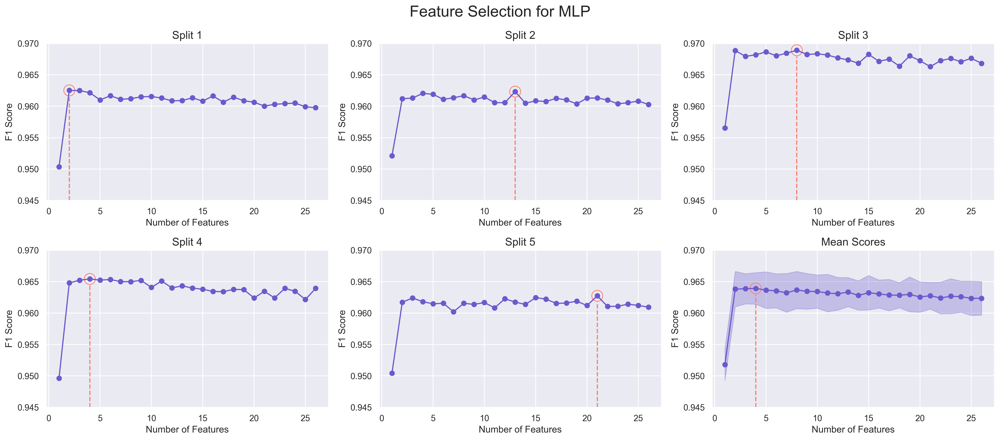

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'FungiData/MLP'
mlp_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(mlp_splits_results, "MLP", y_lims=[0.945, 0.97])

### Selection results summary

,n_features,hidden_layer_sizes,learning_rate_init,solver,test_score,fit_time,score_time
data,,,,,,,
Split 1,2,"(10, 10)",0.010000,sgd,0.962519,0.965003,0.002999
Split 2,13,"(20, 20)",0.010000,adam,0.962320,1.107997,0.002000
Split 3,8,"(20, 20)",0.100000,adam,0.968908,0.839999,0.001997
Split 4,4,"(20, 20)",0.010000,adam,0.965427,0.923001,0.001998
Split 5,21,"(10, 10)",0.100000,adam,0.962743,1.195998,0.002001


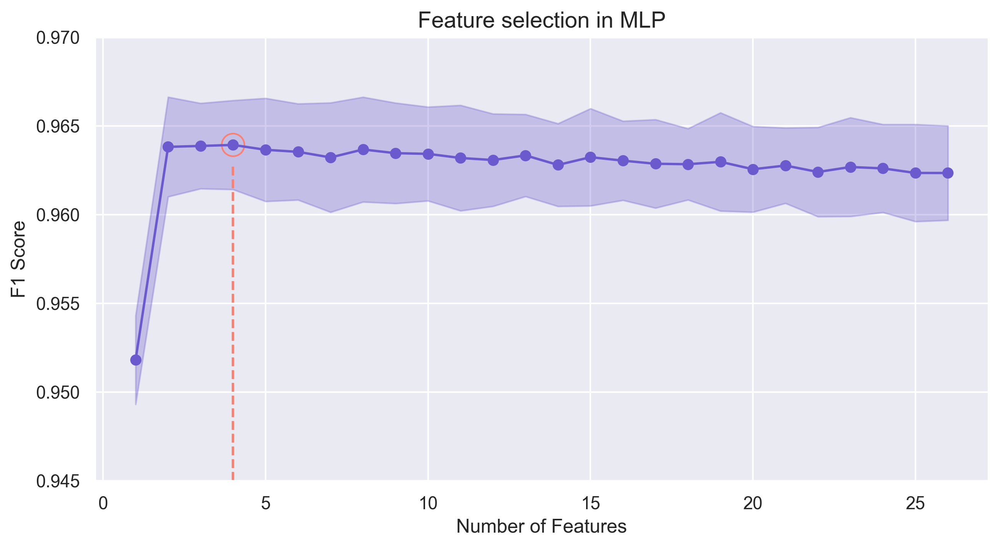

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'FungiData/MLP'

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(figsize=(10,5), dpi=300)
plot_rfeh_results(split_result, ax, f"Feature selection in MLP", std=True, y_lims=[0.945, 0.97])

# View the detail of the best configurations from every split
best_results_cv(save_path=save_path)

Like SVM it seems that with few features got the best results, but maybe is not really enough.

In [43]:
split_result.sort_values(by='score', ascending=False).reset_index(drop=True).head(5)

,n_features,score,std_scores
0,4,0.963926,0.002510
1,3,0.963868,0.002408
2,2,0.963817,0.002809
3,8,0.963669,0.002955
4,5,0.963651,0.002908


Let's go to check with 4 and 8 features to be sure.

## 3.2. Evaluation in test data

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
"MLP (20, 20 neurons, learning rate = 0.1, 4 Features)",0.957873,0.935628,0.980873,0.957717,0.498184,0.002000
"MLP (20, 20 neurons, learning rate = 0.1, 8 Features)",0.957522,0.937090,0.978347,0.957274,0.709936,0.001005
"MLP (20, 20 neurons, learning rate = 0.01, 4 Features)",0.959803,0.938578,0.981595,0.959605,1.003000,0.002000
"MLP (20, 20 neurons, learning rate = 0.01, 8 Features)",0.958048,0.939889,0.976182,0.957692,0.669998,0.001004


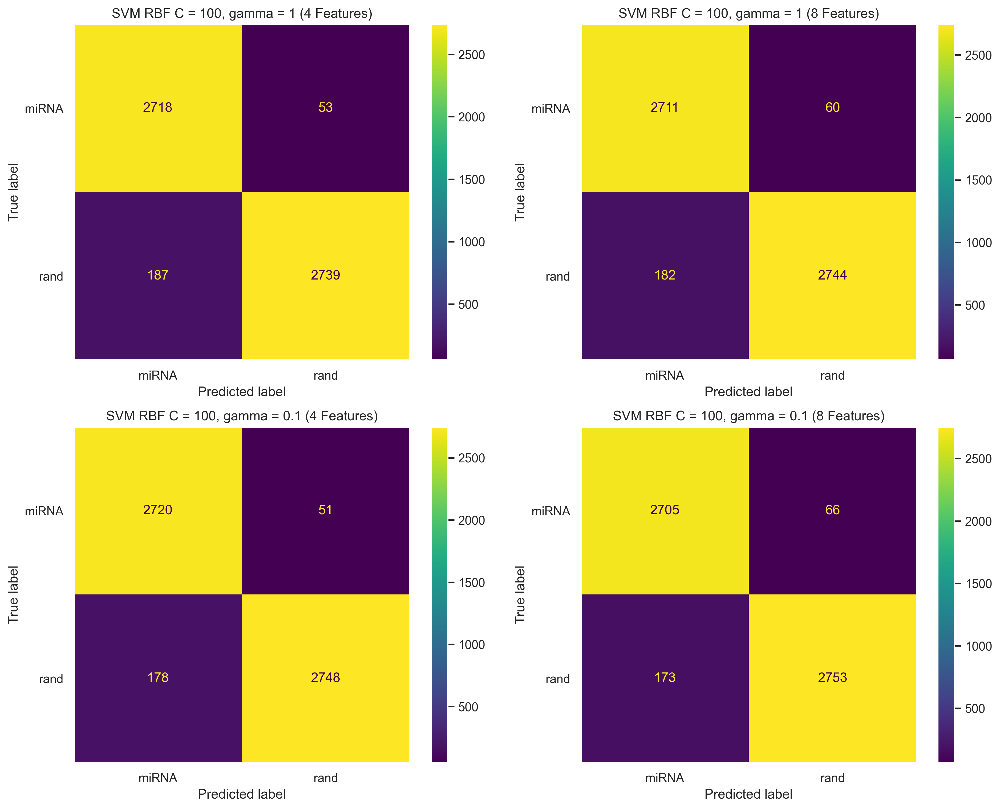

In [47]:
from sklearn.neural_network import MLPClassifier

save_path = f'FungiData/SVM/split_0'

# Best classifier
n_features = [4, 8]
best_estimator = [0]*2
best_estimator[0] = MLPClassifier(
                                hidden_layer_sizes = (20,20),
                                learning_rate_init = 0.1,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
best_estimator[1] = MLPClassifier(
                                hidden_layer_sizes = (20, 20),
                                learning_rate_init = 0.01,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )

report, conf_matrix = [0]*4, [0]*4

fig, ax = plt.subplots(2, 2, figsize=(15,12), dpi=300)
for i in range(2):
    report[i*2], conf_matrix[i*2], _ = estimator_evaluation(
                                            estimator  = best_estimator[i], 
                                            train_data = [X_train_val_std, y_train_val], 
                                            test_data  = [X_test_std, y_test],
                                            n_features = n_features[0],
                                            save_path  = save_path,
                                            model_name = f"MLP (20, 20 neurons, learning rate = {'0.1' if i == 0 else 0.01}, 4 Features)"
                                        )
    report[(i*2)+1], conf_matrix[(i*2)+1], _ = estimator_evaluation(
                                            estimator  = best_estimator[i], 
                                            train_data = [X_train_val_std, y_train_val], 
                                            test_data  = [X_test_std, y_test],
                                            n_features = n_features[1],
                                            save_path  = save_path,
                                            model_name = f"MLP (20, 20 neurons, learning rate = {'0.1' if i == 0 else 0.01}, 8 Features)"
                                        )
    # Plot confusion matrix
    ax[i, 0].set_title(f"SVM RBF {op_names[i]} (4 Features)")
    ax[i, 1].set_title(f"SVM RBF {op_names[i]} (8 Features)")
    conf_matrix[i*2].plot(ax=ax[i, 0])
    conf_matrix[(i*2)+1].plot(ax=ax[i, 1])
    ax[i, 0].grid(False)
    ax[i, 1].grid(False)

full_report = pd.concat(report, axis=0)
full_report.style.highlight_max(color='slateblue', axis=0)\
                 .highlight_min(color='salmon', axis=0)

Like SVM the best results are with only 4 features, so in this dataset is not necessary many features to get best results.

---
# 4. K-Nearest Neighbors

### 4.1. Features and hyperparameters selection

In [49]:
from sklearn.neighbors import KNeighborsClassifier

# Classifier
estimator = KNeighborsClassifier()

# Hyperparameters to evaluate
params_grid = {'n_neighbors' : [5, 10, 15, 20, 25, 30],
               'p': [1, 2]}  # Manhattan and euclidean distance metrics

# Colors to classifier results
colors = ['lightseagreen', 'salmon']

Some parameter settings result in division by zero when calculating F1 Score, this is because the recall and precision of the classifier with these settings is really bad, in fact both are zero, and this means that TP = 0, so the classifier is useless because cannot predict any correct positive result. So we ignore invalid result warnings, because this results will be discarded anyway.

In [28]:
%%time
import warnings

save_path = f'FungiData/KNN'

# Search best configurations
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    knn_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
    knn_splits_results = save_splits_results(knn_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 3
 > F1 Score: 0.9621380846325167
 > Hyperparameters: {'n_neighbors': 30, 'p': 2}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.9609142857142857
 > Hyperparameters: {'n_neighbors': 25, 'p': 1}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.9681697612732095
 > Hyperparameters: {'n_neighbors': 15, 'p': 1}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.9660757277303568
 > Hyperparameters: {'n_neighbors': 30, 'p': 2}

Split 5:
=== Best Results ===================================================================================
 > No. Features: 2
 > F1 Score: 0.962380446333687

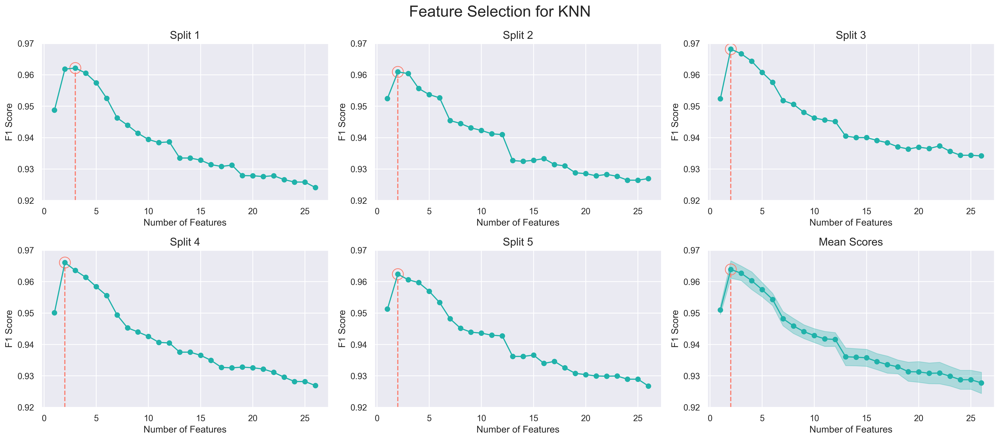

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'FungiData/KNN'
mlp_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(mlp_splits_results, "KNN", y_lims=[0.92, 0.97], colors=colors)

### Selection results summary

,n_features,n_neighbors,p,test_score,fit_time,score_time
data,,,,,,
Split 1,3,30,2,0.962138,0.020001,0.126998
Split 2,2,25,1,0.960914,0.015000,0.102999
Split 3,2,15,1,0.968170,0.013001,0.092001
Split 4,2,30,2,0.966076,0.027327,0.086998
Split 5,2,20,1,0.962380,0.013001,0.097999


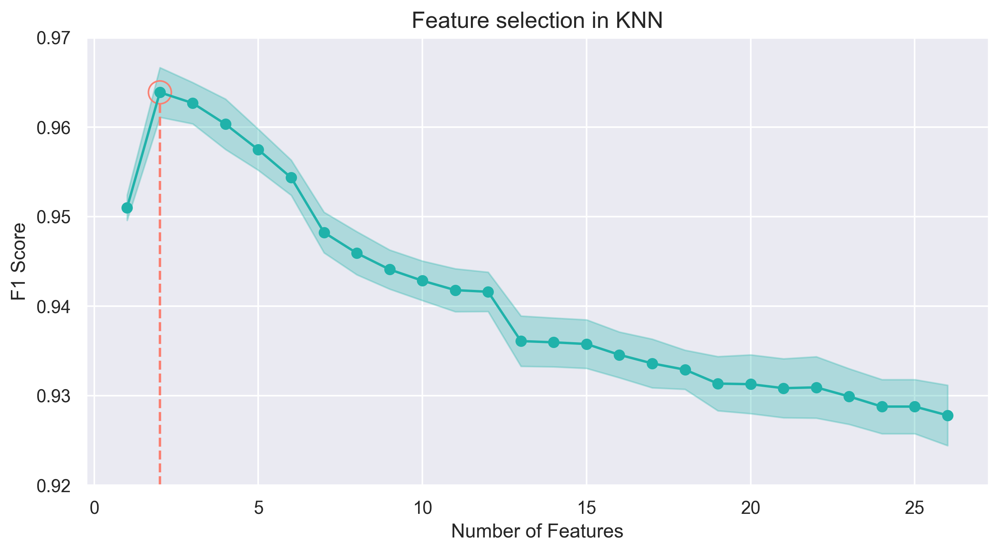

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'FungiData/KNN'
colors = ['lightseagreen', 'salmon']

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(figsize=(10,5), dpi=300)
plot_rfeh_results(split_result, ax, f"Feature selection in KNN", std=True, y_lims=[0.92, 0.97], colors=colors)

# View the detail of the best configurations from every split
best_results_cv(save_path=save_path, colors=colors)

For a better decision, the performance in each number of neighbors by distance metric is graphed below.

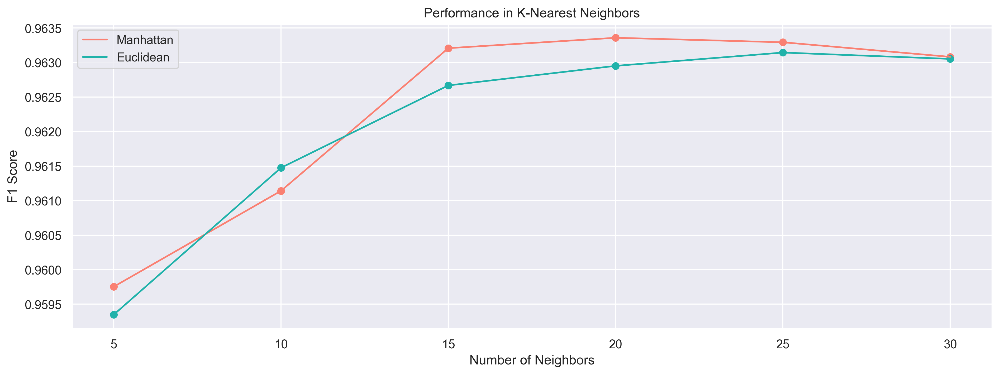

In [57]:
# Compare number of neighbors in best number of features
n_features = 2
save_path = f'FungiData/KNN'
colors = ['lightseagreen', 'salmon']

scores_1, scores_2 = [], []

for i in range(splits):
    df = pd.read_csv(f"{save_path}/split_{i}/{n_features}_features.csv")
    scores_1.append(df[df['param_p'] == 1]['mean_test_score'])
    scores_2.append(df[df['param_p'] == 2]['mean_test_score'])
    n_neighbors = df[df['param_p'] == 1]['param_n_neighbors']

# Plot the comparation
fig, ax = plt.subplots(figsize=(15,5), dpi=300)
ax.set_title("Performance in K-Nearest Neighbors")
ax.plot(n_neighbors, np.mean(scores_1, axis=0), color=colors[1], label="Manhattan")
ax.scatter(n_neighbors, np.mean(scores_1, axis=0), color=colors[1])
ax.plot(n_neighbors, np.mean(scores_2, axis=0), color=colors[0], label="Euclidean")
ax.scatter(n_neighbors, np.mean(scores_2, axis=0), color=colors[0])
ax.set_ylabel("F1 Score")
ax.set_xlabel("Number of Neighbors")
ax.legend()

Is not totally clear the best number of neighbors, so we go to evalate 15, 20 and 25 neighbors in test data

## 4.2. Evaluation in test data

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
KNN (15 neighbors),0.958575,0.939037,0.978347,0.958289,0.013002,0.083011
KNN (20 neighbors),0.959277,0.940952,0.977625,0.958938,0.013000,0.086317
KNN (25 neighbors),0.958048,0.937457,0.979069,0.957811,0.013011,0.089694


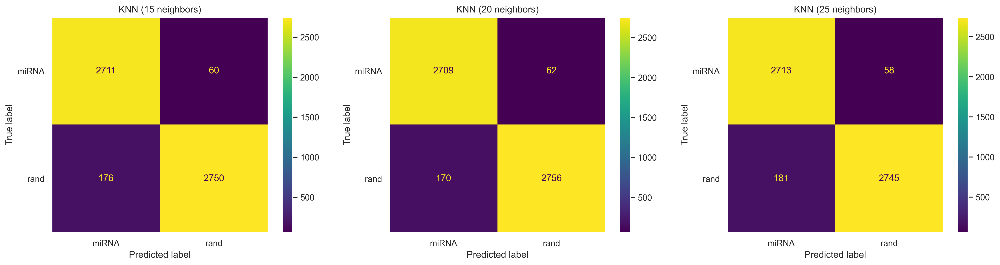

In [52]:
from sklearn.neighbors import KNeighborsClassifier
import warnings

save_path = f'FungiData/KNN/split_0'
colors = ['lightseagreen', 'salmon']

# Best classifiers
n_features = 2

best_estimators = [0]*3
best_estimators[0] = KNeighborsClassifier(n_neighbors=15, p=1)
best_estimators[1] = KNeighborsClassifier(n_neighbors=20, p=1)
best_estimators[2] = KNeighborsClassifier(n_neighbors=25, p=1)

report, conf_matrix = [0]*len(best_estimators), [0]*len(best_estimators)
model_names = ["KNN (15 neighbors)", "KNN (20 neighbors)", "KNN (25 neighbors)"]

# Evaluate the best classifiers
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for i in range(len(best_estimators)):
        report[i], conf_matrix[i], _ = estimator_evaluation(
                                        estimator  = best_estimators[i], 
                                        train_data = [X_train_val_std, y_train_val], 
                                        test_data  = [X_test_std, y_test],
                                        n_features = n_features,
                                        save_path  = save_path,
                                        model_name = model_names[i]
                                    )
# Plot confusion matrix
fig, ax = plt.subplots(1, len(best_estimators), figsize=(22,5), dpi=300)
full_report = pd.DataFrame()
for i in range(len(best_estimators)):
    ax[i].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[i])
    ax[i].grid(False)
    full_report = pd.concat([full_report, report[i]], axis=0)

full_report.style.highlight_max(color=colors[0], axis=0)

Finally with 20 neighbors are the best results.

---
# 5. Naive Bayes

## 5.1. Features and hyperparameters selection

In [58]:
from sklearn.naive_bayes import MultinomialNB

# Classifier
estimator = MultinomialNB()

# Hyperparameters to evaluate
params_grid = {}

# Colors to classifier results
colors = ['#5065DE', 'salmon']

#### Non-normalized data

In [59]:
%%time
save_path = f'FungiData/NaiveBayes'

# Search best configurations
nb_rfeh = rfeh_cv(X_train, X_val, estimator, params_grid, save_path)
nb_splits_results = save_splits_results(nb_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 26
 > F1 Score: 0.9382877009995654
 > Hyperparameters: {}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 26
 > F1 Score: 0.9362549800796813
 > Hyperparameters: {}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 26
 > F1 Score: 0.938801803736311
 > Hyperparameters: {}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 26
 > F1 Score: 0.9393619268962602
 > Hyperparameters: {}

Split 5:
=== Best Results ===================================================================================
 > No. Features: 26
 > F1 Score: 0.936896197327852
 > Hyperparameters: {}
CPU times: total: 8.58 s
Wall time: 28.4 s


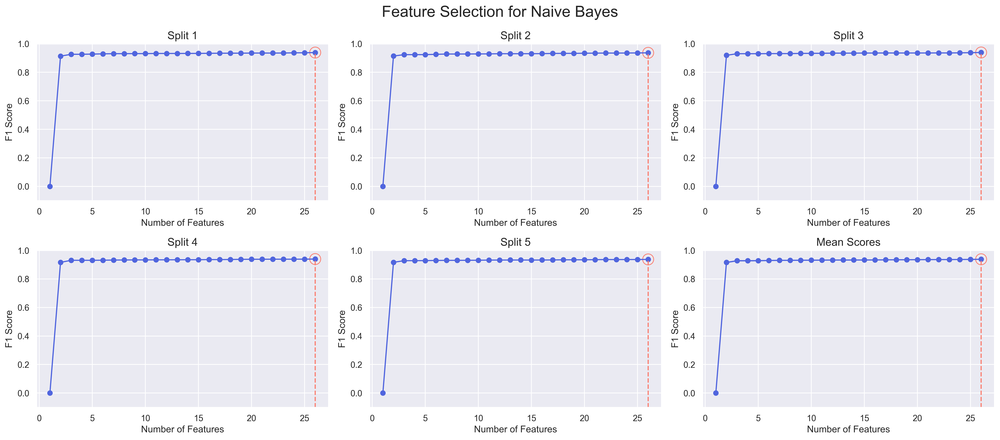

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'FungiData/NaiveBayes'
nb_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(nb_splits_results, "Naive Bayes", y_lims=[-0.1, 1], colors=colors)

#### On Normalized data

In [67]:
%%time
save_path = f'FungiData/NaiveBayes/Normalized'

# Search best configurations
nb_std_rfeh = rfeh_cv(X_train_std, X_val_std, estimator, params_grid, save_path)
nb_std_splits_results = save_splits_results(nb_std_rfeh, save_path=save_path)


Split 1:
=== Best Results ===================================================================================
 > No. Features: 3
 > F1 Score: 0.9186896064105586
 > Hyperparameters: {}

Split 2:
=== Best Results ===================================================================================
 > No. Features: 3
 > F1 Score: 0.9294841457643161
 > Hyperparameters: {}

Split 3:
=== Best Results ===================================================================================
 > No. Features: 3
 > F1 Score: 0.9132398383646304
 > Hyperparameters: {}

Split 4:
=== Best Results ===================================================================================
 > No. Features: 3
 > F1 Score: 0.8982237157945271
 > Hyperparameters: {}

Split 5:
=== Best Results ===================================================================================
 > No. Features: 7
 > F1 Score: 0.8823788546255505
 > Hyperparameters: {}
CPU times: total: 8.44 s
Wall time: 20.8 s


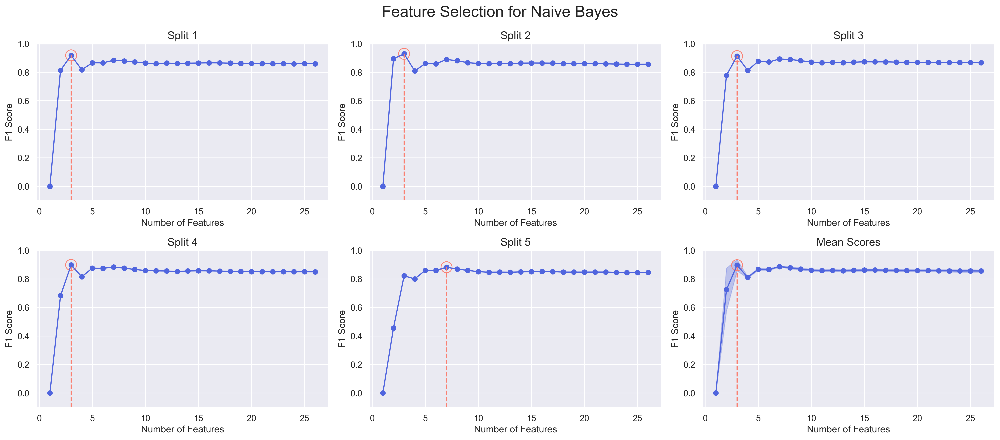

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'FungiData/NaiveBayes/Normalized'
nb_std_splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')

plot_rfeh_splits(nb_std_splits_results, "Naive Bayes", y_lims=[-0.1, 1], colors=colors)

### No Normalized vs Normalized data

,n_features,test_score,fit_time,score_time,n_features (n),test_score (n),fit_time (n),score_time (n)
data,,,,,,,,
Split 1,26,0.938288,0.018999,0.002001,3,0.918690,0.001999,0.002000
Split 2,26,0.936255,0.004999,0.001999,3,0.929484,0.001999,0.002000
Split 3,26,0.938802,0.006009,0.001991,3,0.913240,0.002000,0.001001
Split 4,26,0.939362,0.005001,0.001001,3,0.898224,0.002000,0.001000
Split 5,26,0.936896,0.005000,0.002000,7,0.882379,0.002001,0.002001


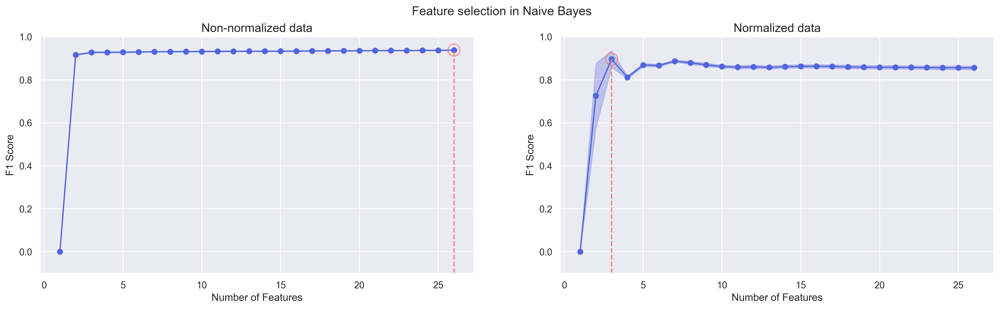

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

splits = 5
save_path = f'FungiData/NaiveBayes'
colors = ['#5065DE', 'salmon']

# Get saved results
splits_results = pd.read_csv(f'{save_path}/splits_results_summary.csv')
std_splits_results = pd.read_csv(f'{save_path}/Normalized/splits_results_summary.csv')

split_result = splits_results[['n_features', 'mean_scores', 'std_scores']]
split_result.columns = ['n_features', 'score', 'std_scores']

std_split_result = std_splits_results[['n_features', 'mean_scores', 'std_scores']]
std_split_result.columns = ['n_features', 'score', 'std_scores']

# Plot features results
fig, ax = plt.subplots(1, 2, figsize=(20,5), dpi=300)
fig.suptitle("Feature selection in Naive Bayes")
plot_rfeh_results(split_result, ax[0], f"Non-normalized data", std=True, y_lims=[-0.1, 1], colors=colors)
plot_rfeh_results(std_split_result, ax[1], f"Normalized data", std=True, y_lims=[-0.1, 1], colors=colors)

# View the detail of the best configurations from every split
results = best_results_cv(save_path=save_path).data
std_results = best_results_cv(save_path=f"{save_path}/Normalized").data
std_results.columns = [col+' (n)' for col in std_results.columns]

compare_Results = pd.concat([results, std_results], axis=1)
compare_Results.style.highlight_max(['fit_time','score_time','fit_time (n)','score_time (n)'], color=colors[0], axis=0)\
                     .highlight_min(['test_score','test_score (n)'], color=colors[0], axis=0)\
                     .highlight_max(['test_score','test_score (n)'], color=colors[1], axis=0)\
                     .highlight_min(['fit_time','score_time','fit_time (n)','score_time (n)'], color=colors[1], axis=0)

## 5.2. Evaluation in test data

,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
Naive Bayes (Non-normalized data),0.934351,0.890773,0.985926,0.935937,0.055484,0.014072
Naive Bayes (Normalized data),0.910830,0.962025,0.850235,0.902682,0.006837,0.006016


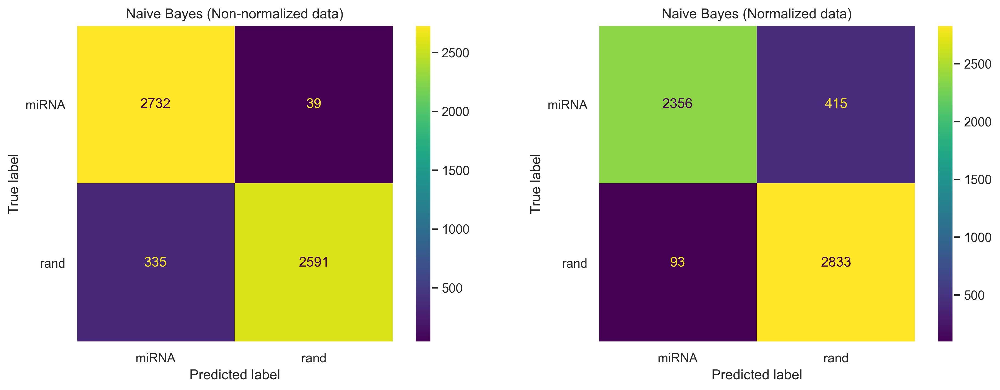

In [33]:
from sklearn.naive_bayes import MultinomialNB

save_path = f'FungiData/NaiveBayes/split_0'
colors = ['#5065DE', 'salmon']

# Best classifier
n_features = [26, 3]
best_estimator = MultinomialNB()

report, conf_matrix = [0]*2, [0]*2
# Evaluate on no normalized data
report[0], conf_matrix[0], _ = estimator_evaluation(
                                estimator  = best_estimator, 
                                train_data = [X_train_val, y_train_val], 
                                test_data  = [X_test, y_test],
                                n_features = n_features[0],
                                save_path  = save_path,
                                model_name = "Naive Bayes (Non-normalized data)"
                            )
# Evaluate on normalized data
report[1], conf_matrix[1], _ = estimator_evaluation(
                                estimator  = best_estimator, 
                                train_data = [X_train_val_std, y_train_val], 
                                test_data  = [X_test_std, y_test],
                                n_features = n_features[1],
                                save_path  = save_path,
                                model_name = "Naive Bayes (Normalized data)"
                            )
# Plot confusion matrix
fig, ax = plt.subplots(1, 2, figsize=(15,5), dpi=300)
ax[0].set_title("Naive Bayes (Non-normalized data)")
ax[1].set_title("Naive Bayes (Normalized data)")
conf_matrix[0].plot(ax=ax[0])
conf_matrix[1].plot(ax=ax[1])
ax[0].grid(False)
ax[1].grid(False)

full_report = pd.concat(report, axis=0)
full_report.style.highlight_max(color=colors[0], axis=0)

In this dataset we get better results that in plant and animal data.

---
---
# Classifiers Comparation Results

### Feature selection plots

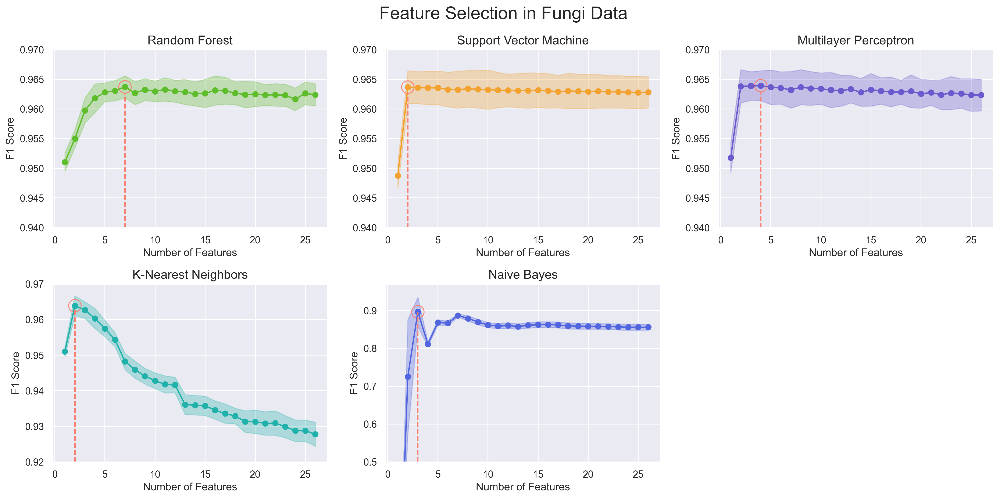

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
sns.set(color_codes=True)

model_files = ['RandomForest/Normalized', 'SVM', 'MLP', 'KNN', 'NaiveBayes/Normalized']
model_names = ['Random Forest', 'Support Vector Machine', 'Multilayer Perceptron', 
               'K-Nearest Neighbors', 'Naive Bayes']

colors = ['#5EBD2A', '#F3A230', 'slateblue', 'lightseagreen', '#5065DE']
y_lims = [[0.94, 0.97]]*3+[[0.92, 0.97]]+[[0.5, 0.97]]

fig, ax = plt.subplots(2, 3, figsize=(16, 8), dpi=300)
fig.suptitle(f"Feature Selection in Fungi Data", fontsize= 20)
for i in range(len(model_files)):
    model_results = pd.read_csv(f'FungiData/{model_files[i]}/splits_results_summary.csv')
    model_results = model_results[['n_features', 'mean_scores', 'std_scores']]
    model_results.columns = ['n_features', 'score', 'std_scores']
    axes = [0,i] if i < 3 else [1, i-3]
    plot_rfeh_results(model_results, ax[axes[0], axes[1]], f"{model_names[i]}", 
                      std=True, colors=[colors[i], 'salmon'], y_lims=y_lims[i])
    fig.tight_layout()
ax[-1, -1].set_visible(False)

### Evaluation in test data

In [54]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC

save_path = "FungiData"
model_files = ['RandomForest', 'SVM', 'MLP', 'KNN', 'NaiveBayes']
model_names = ['Random Forest', 'Support Vector Machine', 'Multilayer Perceptron', 
               'K-Nearest Neighbors', 'Naive Bayes']

n_features, best_estimator = [0]*5, [0]*5
report, conf_matrix, y_preds = [0]*5, [0]*5, [0]*5

# Best hyperparameters ------------------------------------------------------------------
params_list = ['n_estimators: 1000, criterion: gini',
               'kernel: rbf, C: 100, gamma: 0.1',
               'hidden_layer_sizes = (20, 20), learning_rate_init: 0.01, solver: adam',
               'n_neighbors: 20, p: 1',
               '---'
               ]
# Best classifiers ----------------------------------------------------------------------
n_features[0] = 7
best_estimator[0] = RandomForestClassifier(
                                        n_estimators=1000, 
                                        criterion='gini', 
                                        random_state = SEED
                                        )
n_features[1] = 2
best_estimator[1] = SVC(
                     C            = 100,
                     gamma        = 0.1,
                     kernel       = 'rbf',
                     random_state = SEED
                    )
n_features[2] = 4
best_estimator[2] = MLPClassifier(
                                hidden_layer_sizes = (20, 20),
                                learning_rate_init = 0.01,
                                solver             = 'adam', 
                                early_stopping     = True, 
                                random_state       = SEED
                                )
n_features[3] = 2
best_estimator[3] = KNeighborsClassifier(n_neighbors = 20, p = 1)

n_features[4] = 3
best_estimator[4] = MultinomialNB()

,Parameters,No.Features,Accuracy,Precision,Recall,F1 Score,Train Time,Test Time
Random Forest (Fungi Data),"n_estimators: 1000, criterion: gini",7,0.958575,0.937824,0.979791,0.958348,11.041509,0.507000
Support Vector Machine (Fungi Data),"kernel: rbf, C: 100, gamma: 0.1",2,0.959101,0.940625,0.977625,0.958768,1.256000,0.598000
Multilayer Perceptron (Fungi Data),"hidden_layer_sizes = (20, 20), learning_rate_init: 0.01, solver: adam",4,0.959803,0.938578,0.981595,0.959605,1.053005,0.001997
K-Nearest Neighbors (Fungi Data),"n_neighbors: 20, p: 1",2,0.959277,0.940952,0.977625,0.958938,0.012000,0.087000
Naive Bayes (Fungi Data),---,3,0.910830,0.962025,0.850235,0.902682,0.002000,0.001000


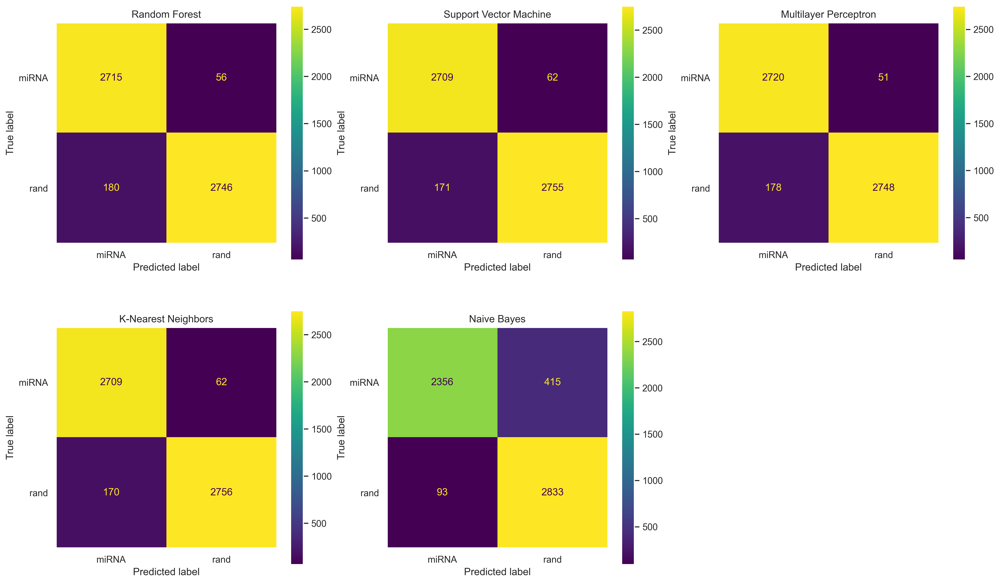

In [56]:
# Evaluate the best classifiers
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for i in range(5):
        report[i], conf_matrix[i], y_preds[i] = estimator_evaluation(
                                        estimator  = best_estimator[i], 
                                        train_data = [X_train_val_std, y_train_val], 
                                        test_data  = [X_test_std, y_test],
                                        n_features = n_features[i],
                                        save_path  = f"{save_path}/{model_files[i]}/split_0",
                                        model_name = model_names[i]+' (Fungi Data)'
                                    )
predict_df = pd.DataFrame(data=np.array(y_preds).T,columns=model_names)
predict_df.to_csv(f"{save_path}/predictions.csv")

# Summary results
fig, ax = plt.subplots(2, 3, figsize=(20,12), dpi=300)
results_summary = pd.DataFrame()
row = 0
for i in range(5):
    if i == 3: row = 1
    ax[row, i - row*3].set_title(model_names[i])
    conf_matrix[i].plot(ax=ax[row, i- row*3])
    ax[row, i - row*3].grid(False)
    results_summary = pd.concat([results_summary, report[i]], axis=0)

ax[-1, -1].axis('off')

# Add parameters in results
results_summary.insert(0, 'Parameters', params_list)
results_summary.insert(1, 'No.Features', n_features)
results_summary.to_csv(f"{save_path}/results_summary.csv")
results_summary.style.highlight_max(color='salmon', subset=results_summary.columns[2:])\
                     .highlight_min(color='slateblue', subset=results_summary.columns[2:])

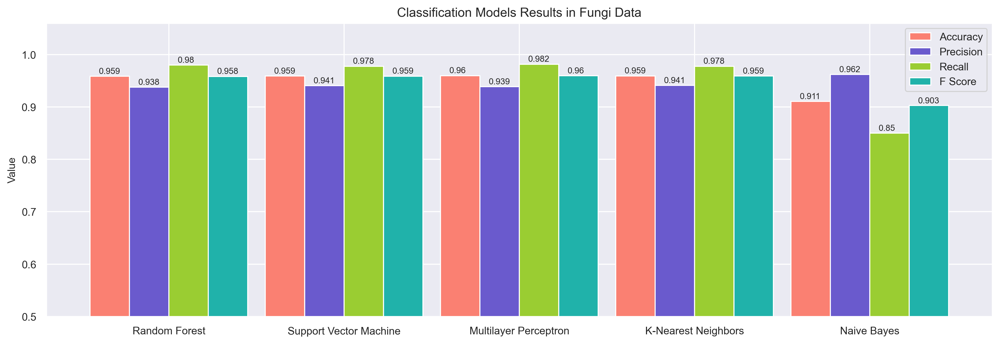

In [60]:
# Plot metrics results
results_summary = pd.read_csv("FungiData/results_summary.csv")

colors = ['salmon', 'slateblue', 'yellowgreen', 'lightseagreen']
model_names = ['Random Forest', 'Support Vector Machine', 'Multilayer Perceptron', 
               'K-Nearest Neighbors', 'Naive Bayes']

results_plot = results_summary.filter(regex = '(Accuracy|Precision|Recall|F1 Score)')
ax = results_plot.plot(kind='bar', figsize=(16, 5), width=0.9, color=colors, fontsize=10)
ax.set_title('Classification Models Results in Fungi Data', fontsize=12)
ax.legend(['Accuracy', 'Precision', 'Recall', 'F Score'], bbox_to_anchor=[1, 1], fontsize=10)
ax.set_xticklabels(model_names, fontsize=10, rotation=0)
ax.set_ylabel('Value', fontsize=10)
ax.set_ylim(0.5, 1.06)
ax.figure.dpi = 300
for p in ax.patches:
    ax.annotate(str(round(p.get_height(),3)), (p.get_x() + 0.05, p.get_height() * 1.005), fontsize=8)

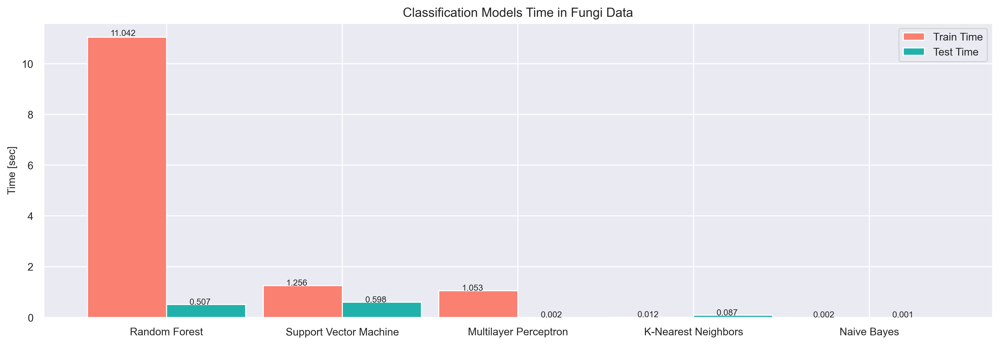

In [61]:
# Plot time results
results_summary = pd.read_csv("FungiData/results_summary.csv")

colors = ['salmon','lightseagreen']
model_names = ['Random Forest', 'Support Vector Machine', 'Multilayer Perceptron', 
               'K-Nearest Neighbors', 'Naive Bayes']

results_plot = results_summary.filter(regex = '(.Time)')
ax = results_plot.plot(kind='bar', figsize=(16, 5), width=0.9, color=colors, fontsize=10)
ax.set_title('Classification Models Time in Fungi Data', fontsize=12)
ax.legend(['Train Time', 'Test Time'], bbox_to_anchor=[1, 1], fontsize=10)
ax.set_xticklabels(model_names, fontsize=10, rotation=0)
ax.set_ylabel('Time [sec]', fontsize=10)
ax.figure.dpi = 300
for p in ax.patches:
    ax.annotate(str(round(p.get_height(),3)), (p.get_x() + 0.13, p.get_height() * 1.005), fontsize=8)